# Import Packages

In [1]:
# Import Packages
import pandas as pd
import matplotlib.pyplot as plt
from dataprep.eda import plot
import sys
import numpy as np
import geopandas as gpd
from shapely.geometry import Point, Polygon

/Users/Luisa/.pyenv/versions/3.7.12/envs/BDL-A1/lib/python3.7/site-packages/pandas/compat/__init__.py:124: UserWarning: Could not import the lzma module. Your installed Python is incomplete. Attempting to use lzma compression will result in a RuntimeError.
  warnings.warn(msg)


# Load Datasets

In [2]:
# Load Hospital Dataset
dataset_name = 'New_York_State_Statewide_COVID-19_Hospitalizations_and_Beds.csv'
all_data = pd.read_csv('../dataSources/NY/' + dataset_name, parse_dates=['As of Date'])

In [3]:
all_data.head()

,As of Date,Facility PFI,Facility Name,DOH Region,Facility County,Facility Network,NY Forward Region,Patients Currently Hospitalized,Patients Newly Admitted,Patients Positive After Admission,...,Patients Age Less Than 1 Year,Patients Age 1 To 4 Years,Patients Age 5 to 19 Years,Patients Age 20 to 44 Years,Patients Age 45 to 54 Years,Patients Age 55 to 64 Years,Patients Age 65 to 74 Years,Patients Age 75 to 84 Years,Patients Age Greater Than 85 Years,Hospitalized Indicator
0,2020-03-26,1,ALBANY MEDICAL CENTER HOSPITAL,CAPITAL DISTRICT REGIONAL OFFICE,ALBANY,ALBANY MEDICAL CENTER,CAPITAL REGION,12.0,1.0,1.0,...,1.0,0.0,0.0,1.0,0.0,4.0,3.0,2.0,1.0,0
1,2020-03-26,5,ST PETERS HOSPITAL,CAPITAL DISTRICT REGIONAL OFFICE,ALBANY,ST. PETERS HEALTH PARTNERS,CAPITAL REGION,10.0,0.0,2.0,...,0.0,0.0,0.0,0.0,0.0,3.0,4.0,2.0,1.0,0
2,2020-03-26,37,CUBA MEMORIAL HOSPITAL INC,WESTERN REGIONAL OFFICE,ALLEGANY,INDEPENDENT,WESTERN NEW YORK,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
3,2020-03-26,39,MEMORIAL HOSP OF WM F AND GERTRUDE F JONES AKA...,WESTERN REGIONAL OFFICE,ALLEGANY,UNIVERSITY OF ROCHESTER MEDICAL CENTER,WESTERN NEW YORK,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
4,2020-03-26,42,UNITED HEALTH SERVICES HOSPITALS INC - BINGHAM...,CENTRAL REGIONAL OFFICE,BROOME,"UNITED HEALTH SERVICES HOSPITALS, INC.",SOUTHERN TIER,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0


  0%|                                                  | 0/3038 [00:00<?, ?it/s]


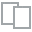
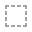
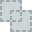
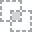
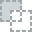
...
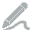
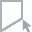
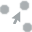
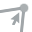
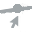

In [7]:
plot(all_data)

In [4]:
# Adding population information for each county in the dataset.
# Load maps data from New York State
maps_data_path = '/Users/Luisa/Documents/GitHub/cmpt-733-term-project/data/NYS_Civil_Boundaries.shp.zip'
street_map = gpd.read_file(maps_data_path)
street_map.head()

,NAME,MUNI_TYPE,MUNITYCODE,COUNTY,GNIS_ID,FIPS_CODE,SWIS,POP1990,POP2000,POP2010,POP2020,DOS_LL,DOSLL_DATE,MAP_SYMBOL,CALC_SQ_MI,DATEMOD,Shape_Leng,Shape_Area,geometry
0,Adams,town,2,Jefferson,978655,3604500210,222000,4977,4782,5143,4973,None,None,T,42.361757,2018-11-06,41971.838963,1.097164e+08,"POLYGON ((419711.937 4860894.762, 420725.148 4..."
1,Addison,town,2,Steuben,978656,3610100287,462000,2645,2640,2595,2397,None,None,T,25.777686,2018-03-01,33582.894334,6.676390e+07,"POLYGON ((311738.502 4672651.742, 312215.800 4..."
2,Afton,town,2,Chenango,978657,3601700353,082000,2972,2977,2851,2769,None,None,T,46.677247,2017-09-01,56181.056904,1.208935e+08,"POLYGON ((457510.038 4679307.408, 457514.525 4..."
3,Alabama,town,2,Genesee,978658,3603700474,182000,1998,1881,1869,1602,None,None,T,52.236298,2018-02-12,48055.772466,1.352914e+08,"POLYGON ((223125.570 4780997.861, 224223.622 4..."
4,Albany,city,1,Albany,978659,3600101000,010100,101082,95658,97856,99224,None,None,1,21.990002,2017-11-10,52588.062435,5.695384e+07,"POLYGON ((594045.717 4729421.064, 594243.246 4..."


In [5]:
# Create key column to merge with hospital data
# Capitalize County Column
def make_upper(row):
    return row['COUNTY'].upper()
street_map['Facility County Modified'] = street_map.apply(lambda x: make_upper(x), axis=1)

In [6]:
# Need to groupby county and sum the populations to include city and town
street_map_grouped = street_map.groupby('Facility County Modified').sum()['POP2020']

In [7]:
# Group Counties into a single one [NEW YORK, BRONX, KINGS, RICHMOND, QUEENS] --> 'NEW YORK, BRONX, KINGS, RICHMOND, QUEENS'
# in order to make the county columns similar to maps dataset
def group_counties(row):
    if row['Facility County'] in ['NEW YORK', 'BRONX', 'KINGS', 'RICHMOND', 'QUEENS']:
        return 'NEW YORK, BRONX, KINGS, RICHMOND, QUEENS'
    elif row['Facility County'] == 'ST.LAWRENCE':
        return 'ST LAWRENCE'
    else:
        return row['Facility County']
all_data['Facility County Modified'] = all_data.apply(lambda x: group_counties(x), axis=1)

In [8]:
all_data = pd.merge(all_data, street_map_grouped, how="left", on=["Facility County Modified"])

# Questions from this dataset

In [1]:
#1.What was the number of covid patients hospitalized in the state of NY in 2020 and 2021
#2.What are the counties with the highest and lowest number of patients hospitalized for each year respectively?
#3.What about patients in ICU Beds?
#4.What was the age distribution of hospitalized patients? What was the age distribution by county?

## What was the number of covid patients hospitalized in the state of NY?

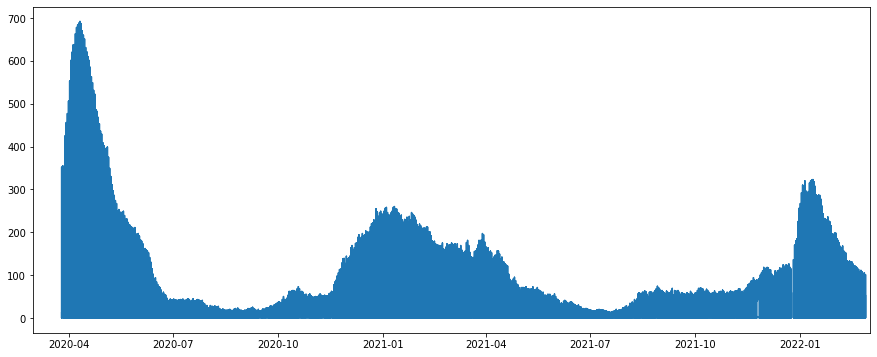

In [9]:
fig, ax = plt.subplots(figsize=(15,6))
ax.plot(all_data['As of Date'], all_data['Patients Currently Hospitalized'])
ax.set_xlabel = 'Days of the Year'
ax.set_ylabel = 'Number of COVID patients Hospitalized'
ax.set_xlim(pd.Timestamp('03-01-2020'), pd.Timestamp('03-03-2022'))
# plt.xlim(['03-01-2020', '01-01-2022'])
plt.show()

In [9]:
# data_2020 = all_data[all_data['As of Date'] < '01-01-2021']
# fig, ax = plt.subplots(figsize=(15,6))
# ax.plot(data_2020['As of Date'], data_2020['Patients Currently Hospitalized'])
# ax.xlabel = 'Days of the Year'
# ax.ylabel = 'Number of COVID patients Hospitalized'
# plt.show()

In [10]:
# data_2021 = all_data[(all_data['As of Date'] >= '01-01-2021') & (all_data['As of Date'] < '01-01-2022')]
# fig, ax = plt.subplots(figsize=(15,6))
# ax.plot(data_2021['As of Date'], data_2021['Patients Currently Hospitalized'])
# plt.show()

## What are the counties with the highest and lowest number of patients hospitalized?

In [10]:
# For this question is necessary to divide by the population of each county
all_data['Patients Currently Hospitalized_by_pop'] = all_data['Patients Currently Hospitalized'] / all_data['POP2020']
all_data['Patients Currently in ICU_by_pop'] = all_data['Patients Currently in ICU'] / all_data['POP2020']

In [11]:
# all_data.head()

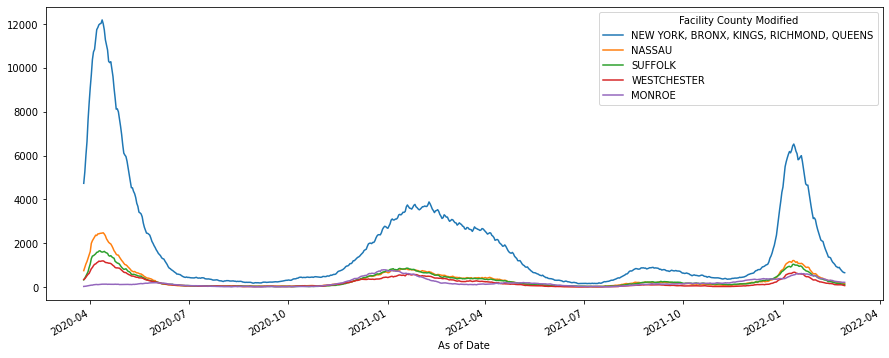

In [12]:
# Top 5 counties with the highest number of hospitalized patients
all_data_by_county = all_data.groupby('Facility County Modified').sum()['Patients Currently Hospitalized']
top5 = all_data_by_county.sort_values(ascending=False)[:5].index.to_list()
bottom5 = all_data_by_county.sort_values(ascending=True)[:5].index.to_list()
all_data_by_county = all_data.groupby(['As of Date', 'Facility County Modified']).sum()['Patients Currently Hospitalized'].unstack()
ax.set_xlabel = 'Days of the Year'
ax.set_ylabel = 'Number of COVID patients Hospitalized'

fig, ax = plt.subplots(figsize=(15,6))
all_data_by_county[top5].plot(ax=ax)
plt.show()

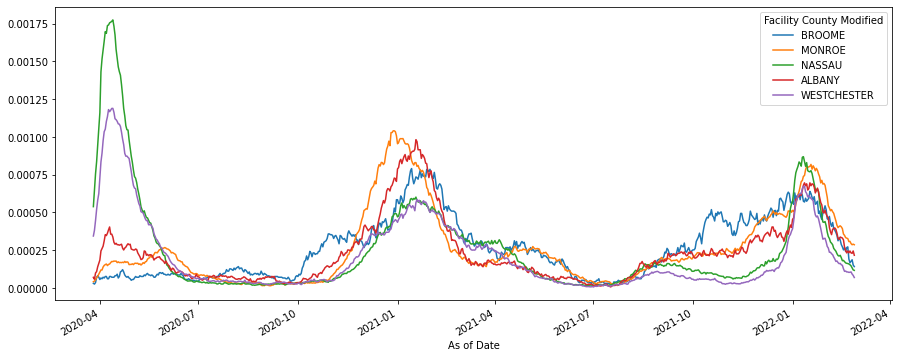

In [13]:
# Top 5 counties with the highest proportion of hospitalized patients per population count
all_data_by_county = all_data.groupby('Facility County Modified').sum()['Patients Currently Hospitalized_by_pop']
top5 = all_data_by_county.sort_values(ascending=False)[:5].index.to_list()
bottom5 = all_data_by_county.sort_values(ascending=True)[:5].index.to_list()
all_data_by_county = all_data.groupby(['As of Date', 'Facility County Modified']).sum()['Patients Currently Hospitalized_by_pop'].unstack()
ax.set_xlabel = 'Days of the Year'
ax.set_ylabel = 'Proportion of COVID patients Hospitalized by population count'

fig, ax = plt.subplots(figsize=(15,6))
all_data_by_county[top5].plot(ax=ax)
plt.show()

In [15]:
# Bottom Counties
# fig, ax = plt.subplots(figsize=(15,6))
# all_data_by_county[bottom5].plot(ax=ax)
# plt.show()

# Hospitalizations by Year

## YEAR 2020

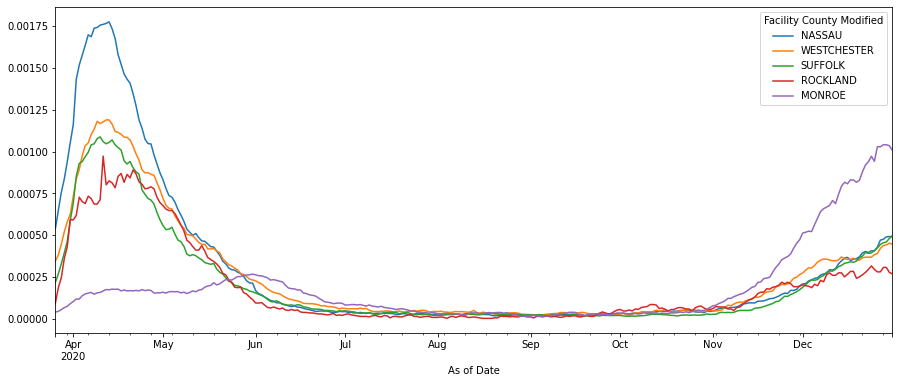

In [18]:
# Top 5 counties with the highest proportion of hospitalized patients per population count in 2020
data_2020 = all_data[all_data['As of Date'] < '01-01-2021']
data_2020_by_county = data_2020.groupby('Facility County').sum()['Patients Currently Hospitalized_by_pop']
top5 = data_2020_by_county.sort_values(ascending=False)[:5].index.to_list()
bottom5 = data_2020_by_county.sort_values(ascending=True)[:5].index.to_list()
data_2020_by_county = data_2020.groupby(['As of Date', 'Facility County Modified']).sum()['Patients Currently Hospitalized_by_pop'].unstack()

fig, ax = plt.subplots(figsize=(15,6))
data_2020_by_county[top5].plot(ax=ax)
plt.show()

In [20]:
# Bottom 5 counties with the highest number of hospitalized patients by day in 2020
# fig, ax = plt.subplots(figsize=(15,6))
# data_2020_by_county[bottom5].plot(ax=ax)
# plt.show()

## Year 2021

In [22]:
# data_2021 = all_data[(all_data['As of Date'] >= '01-01-2021') & (all_data['As of Date'] < '01-01-2022')]
# data_2021_by_county = data_2020.groupby('Facility County Modified').sum()['Patients Currently Hospitalized_by_pop']
# top5 = data_2021_by_county.sort_values(ascending=False)[:5].index.to_list()
# bottom5 = data_2021_by_county.sort_values(ascending=True)[:5].index.to_list()

# fig, ax = plt.subplots(figsize=(15,6))
# data_2021 = all_data[(all_data['As of Date'] >= '01-01-2021') & (all_data['As of Date'] < '01-01-2022')]
# data_2021.groupby(['As of Date', 'Facility County Modified']).sum()['Patients Currently Hospitalized_by_pop'].unstack().plot(ax=ax)
# plt.show()

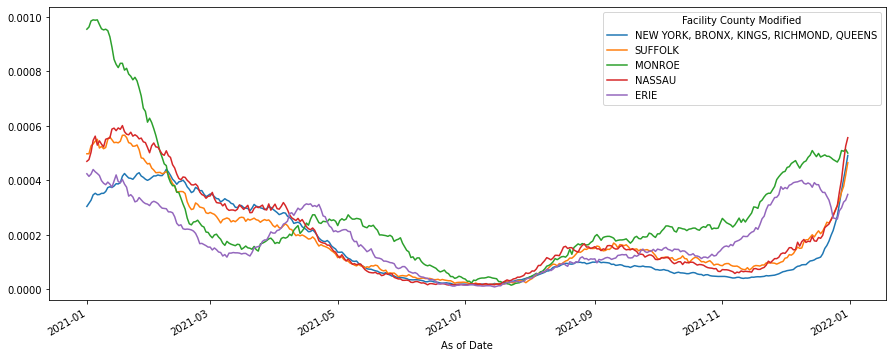

In [31]:
# Top 5 counties with the highest proportion of hospitalized patients per population count in 2021
data_2021 = all_data[(all_data['As of Date'] >= '01-01-2021') & (all_data['As of Date'] < '01-01-2022')]
data_2021_by_county = data_2021.groupby(['As of Date', 'Facility County Modified']).sum()['Patients Currently Hospitalized_by_pop'].unstack()
fig, ax = plt.subplots(figsize=(15,6))
data_2021_by_county[top5].plot(ax=ax)
plt.show()

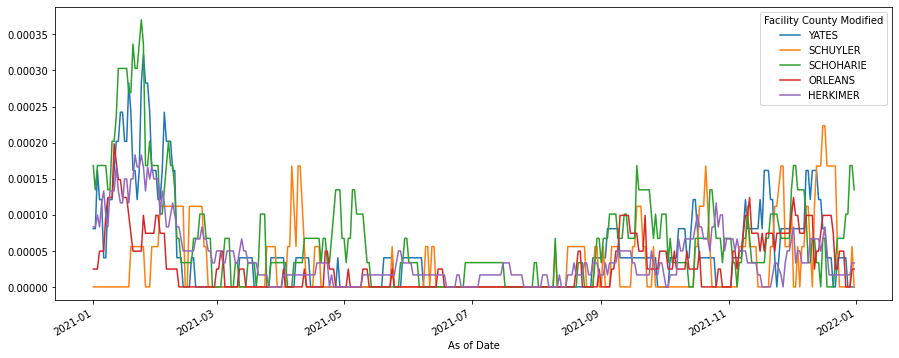

In [32]:
# Bottom 5 Counties
fig, ax = plt.subplots(figsize=(15,6))
data_2021_by_county[bottom5].plot(ax=ax)
plt.show()

## What about patients in ICU Beds?

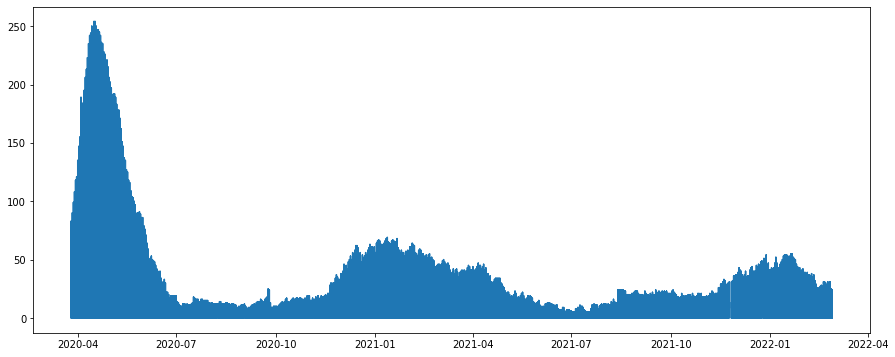

In [25]:
# All Pandemic
fig, ax = plt.subplots(figsize=(15,6))
ax.plot(all_data['As of Date'], all_data['Patients Currently in ICU'])
ax.xlabel = 'Days of the Year'
ax.ylabel = 'Number of COVID patients Hospitalized'
plt.show()

In [26]:
# # Year 2020
# data_2020 = all_data[all_data['As of Date'] < '01-01-2021']
# fig, ax = plt.subplots(figsize=(15,6))
# ax.plot(data_2020['As of Date'], data_2020['Patients Currently in ICU'])
# ax.xlabel = 'Days of the Year'
# ax.ylabel = 'Number of COVID patients Hospitalized'
# plt.show()

In [27]:
# Year 2021
# data_2021 = all_data[(all_data['As of Date'] >= '01-01-2021') & (all_data['As of Date'] < '01-01-2022')]
# fig, ax = plt.subplots(figsize=(15,6))
# ax.plot(data_2021['As of Date'], data_2021['Patients Currently in ICU'])
# plt.show()

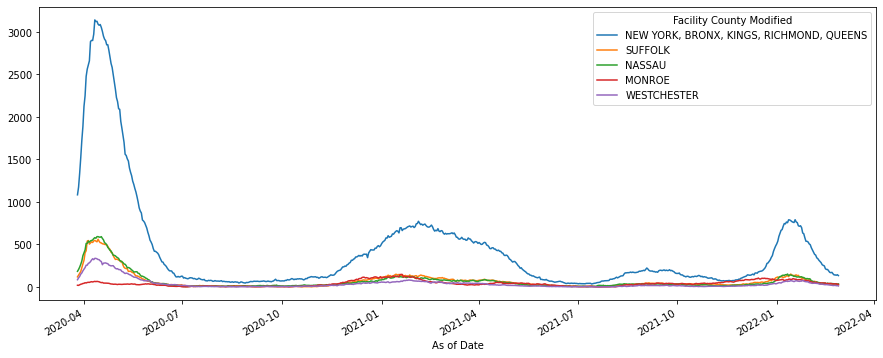

In [28]:
# Top 5 counties with the highest number of ICU patients by day ALL Pandemic
all_data_by_county = all_data.groupby('Facility County Modified').sum()['Patients Currently in ICU']
top5 = all_data_by_county.sort_values(ascending=False)[:5].index.to_list()
bottom5 =all_data_by_county.sort_values(ascending=True)[:5].index.to_list()
all_data_by_county = all_data.groupby(['As of Date', 'Facility County Modified']).sum()['Patients Currently in ICU'].unstack()

fig, ax = plt.subplots(figsize=(15,6))
all_data_by_county[top5].plot(ax=ax)
plt.show()

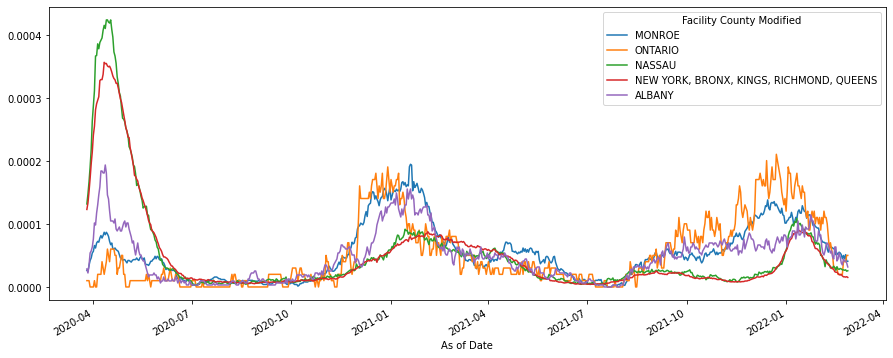

In [29]:
# Top 5 counties with the highest proportion of ICU patients per population count
all_data_by_county = all_data.groupby('Facility County Modified').sum()['Patients Currently in ICU_by_pop']
top5 = all_data_by_county.sort_values(ascending=False)[:5].index.to_list()
bottom5 =all_data_by_county.sort_values(ascending=True)[:5].index.to_list()
all_data_by_county = all_data.groupby(['As of Date', 'Facility County Modified']).sum()['Patients Currently in ICU_by_pop'].unstack()

fig, ax = plt.subplots(figsize=(15,6))
all_data_by_county[top5].plot(ax=ax)
plt.show()

# ICU BY YEAR

## Year 2020

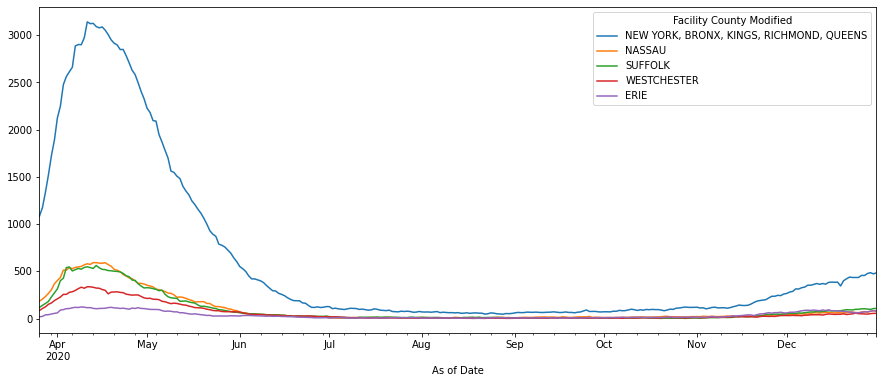

In [37]:
# Top 5 counties with the highest number of ICU patients by day in 2020
data_2020 = all_data[all_data['As of Date'] < '01-01-2021']
data_2020_by_county = data_2020.groupby('Facility County Modified').sum()['Patients Currently in ICU']
top5 = data_2020_by_county.sort_values(ascending=False)[:5].index.to_list()
bottom5 = data_2020_by_county.sort_values(ascending=True)[:5].index.to_list()
data_2020_by_county = data_2020.groupby(['As of Date', 'Facility County Modified']).sum()['Patients Currently in ICU'].unstack()

fig, ax = plt.subplots(figsize=(15,6))
data_2020_by_county[top5].plot(ax=ax)
plt.show()

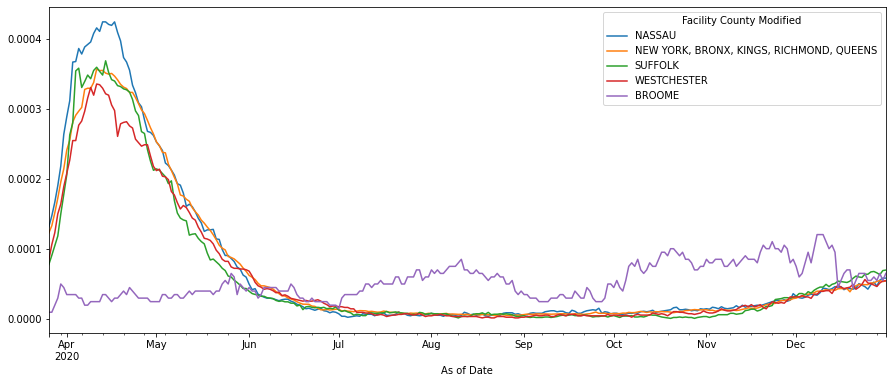

In [38]:
# Top 5 counties with the highest proportion of ICU patients per population count in 2020
data_2020 = all_data[all_data['As of Date'] < '01-01-2021']
data_2020_by_county = data_2020.groupby('Facility County Modified').sum()['Patients Currently in ICU_by_pop']
top5 = data_2020_by_county.sort_values(ascending=False)[:5].index.to_list()
bottom5 = data_2020_by_county.sort_values(ascending=True)[:5].index.to_list()
data_2020_by_county = data_2020.groupby(['As of Date', 'Facility County Modified']).sum()['Patients Currently in ICU_by_pop'].unstack()

fig, ax = plt.subplots(figsize=(15,6))
data_2020_by_county[top5].plot(ax=ax)
plt.show()

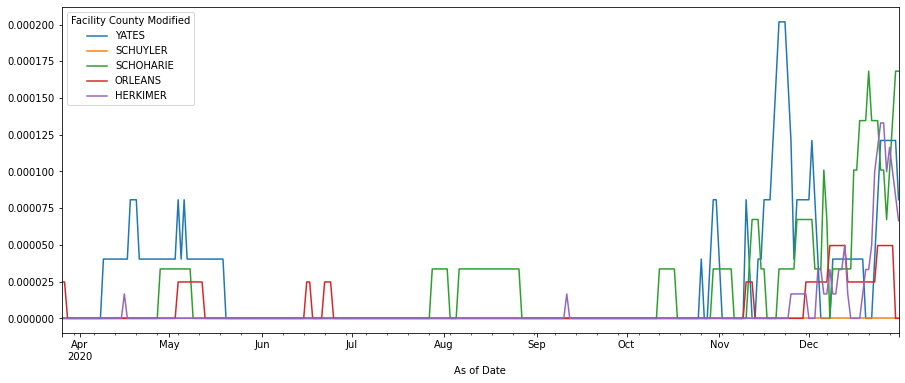

In [33]:
# Bottom 5 counties with the highest number of ICU patients by day in 2020
fig, ax = plt.subplots(figsize=(15,6))
data_2020_by_county[bottom5].plot(ax=ax)
plt.show()

## Year 2021

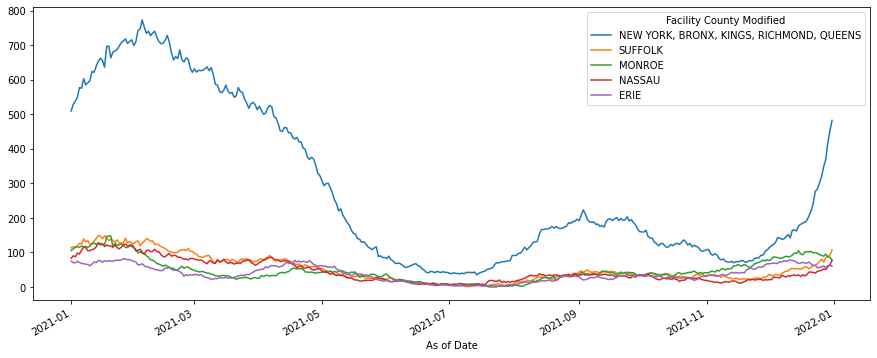

In [30]:
# Top 5 counties with the highest number of ICU patients by day in 2021
data_2021 = all_data[(all_data['As of Date'] >= '01-01-2021') & (all_data['As of Date'] < '01-01-2022')]
data_2021_by_county = data_2021.groupby('Facility County Modified').sum()['Patients Currently in ICU']
top5 = data_2021_by_county.sort_values(ascending=False)[:5].index.to_list()
bottom5 = data_2021_by_county.sort_values(ascending=True)[:5].index.to_list()

data_2021 = all_data[(all_data['As of Date'] >= '01-01-2021') & (all_data['As of Date'] < '01-01-2022')]
data_2021_by_county = data_2021.groupby(['As of Date', 'Facility County Modified']).sum()['Patients Currently in ICU'].unstack()
fig, ax = plt.subplots(figsize=(15,6))
data_2021_by_county[top5].plot(ax=ax)
plt.show()

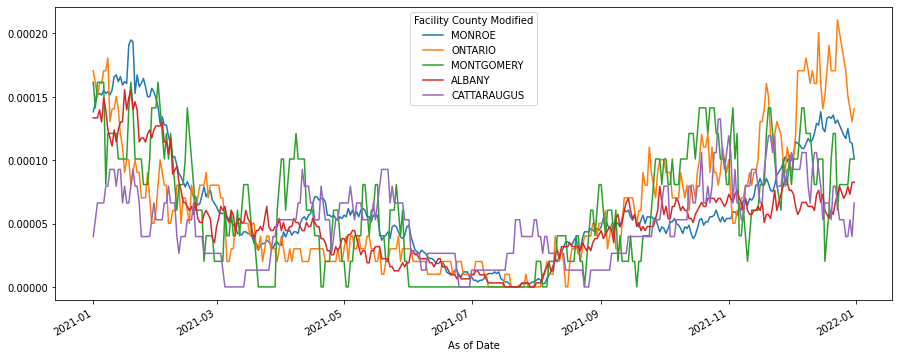

In [43]:
# Top 5 counties with the highest proportion of ICU patients per population count in 2021
data_2021 = all_data[(all_data['As of Date'] >= '01-01-2021') & (all_data['As of Date'] < '01-01-2022')]
data_2021_by_county = data_2021.groupby('Facility County Modified').sum()['Patients Currently in ICU_by_pop']
top5 = data_2021_by_county.sort_values(ascending=False)[:5].index.to_list()
bottom5 = data_2021_by_county.sort_values(ascending=True)[:5].index.to_list()

data_2021 = all_data[(all_data['As of Date'] >= '01-01-2021') & (all_data['As of Date'] < '01-01-2022')]
data_2021_by_county = data_2021.groupby(['As of Date', 'Facility County Modified']).sum()['Patients Currently in ICU_by_pop'].unstack()
fig, ax = plt.subplots(figsize=(15,6))
data_2021_by_county[top5].plot(ax=ax)
plt.show()

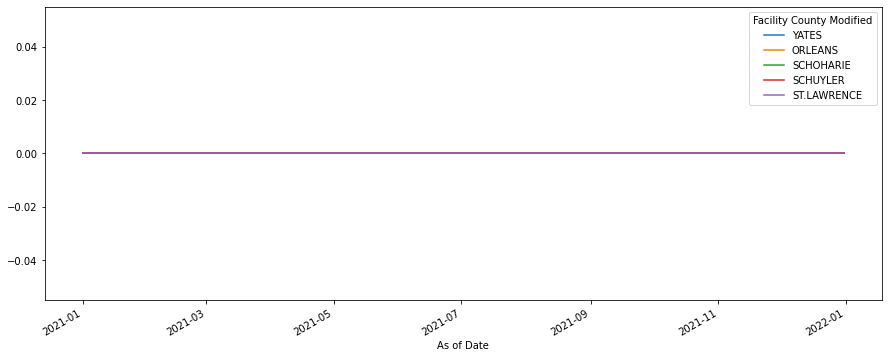

In [44]:
# Bottom 5 counties with the highest number of ICU patients by day in 2021
fig, ax = plt.subplots(figsize=(15,6))
data_2021_by_county[bottom5].plot(ax=ax)
plt.show()

## 4. What was the age distribution of hospitalized patients? What was the age distribution for the top 5 and bottom 5 counties with more Covid Cases ?


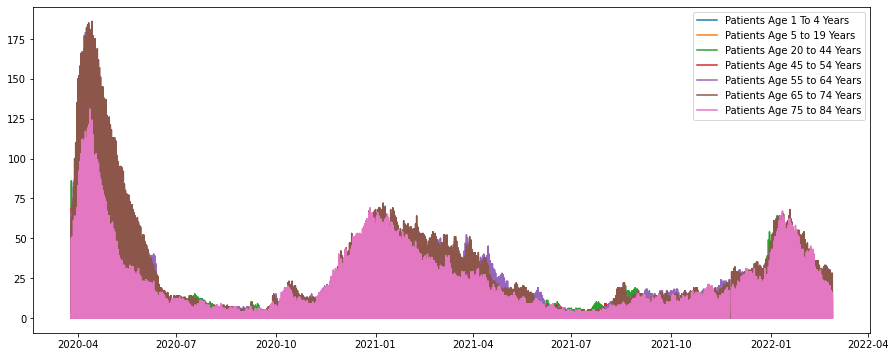

In [45]:
age_columns = ['Patients Age 1 To 4 Years', 'Patients Age 5 to 19 Years', 'Patients Age 20 to 44 Years',
               'Patients Age 45 to 54 Years', 'Patients Age 55 to 64 Years', 'Patients Age 65 to 74 Years',
               'Patients Age 75 to 84 Years']


# data_2020 = all_data[all_data['As of Date'] < '01-01-2021']
fig, ax = plt.subplots(figsize=(15,6))
for age in age_columns:
    ax.plot(all_data['As of Date'], all_data[age])
ax.legend(age_columns)
ax.xlabel = 'Days of the Year'
ax.ylabel = 'Number of COVID patients Hospitalized'
plt.show()

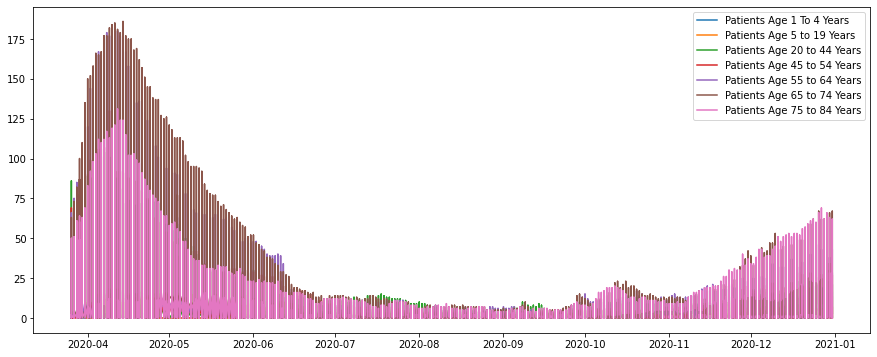

In [29]:
age_columns = ['Patients Age 1 To 4 Years', 'Patients Age 5 to 19 Years', 'Patients Age 20 to 44 Years',
               'Patients Age 45 to 54 Years', 'Patients Age 55 to 64 Years', 'Patients Age 65 to 74 Years',
               'Patients Age 75 to 84 Years']


data_2020 = all_data[all_data['As of Date'] < '01-01-2021']
fig, ax = plt.subplots(figsize=(15,6))
for age in age_columns:
    ax.plot(data_2020['As of Date'], data_2020[age])
ax.legend(age_columns)
ax.xlabel = 'Days of the Year'
ax.ylabel = 'Number of COVID patients Hospitalized'
plt.show()

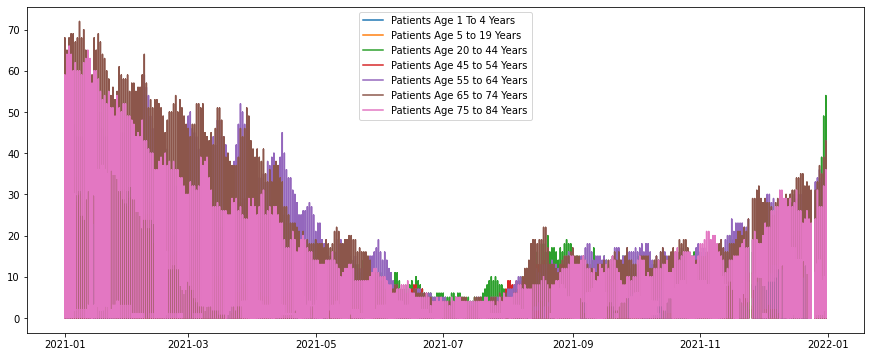

In [30]:
age_columns = ['Patients Age 1 To 4 Years', 'Patients Age 5 to 19 Years', 'Patients Age 20 to 44 Years',
               'Patients Age 45 to 54 Years', 'Patients Age 55 to 64 Years', 'Patients Age 65 to 74 Years',
               'Patients Age 75 to 84 Years']

data_2021 = all_data[(all_data['As of Date'] >= '01-01-2021') & (all_data['As of Date'] < '01-01-2022')]
fig, ax = plt.subplots(figsize=(15,6))
for age in age_columns:
    ax.plot(data_2021['As of Date'], data_2021[age])
ax.legend(age_columns)
plt.show()

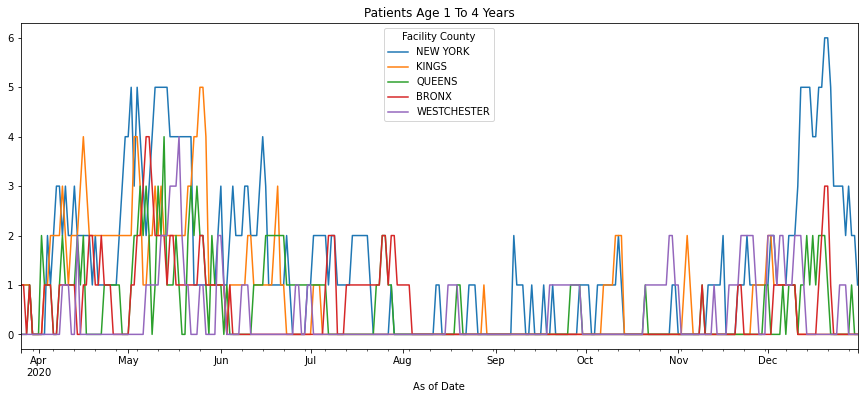

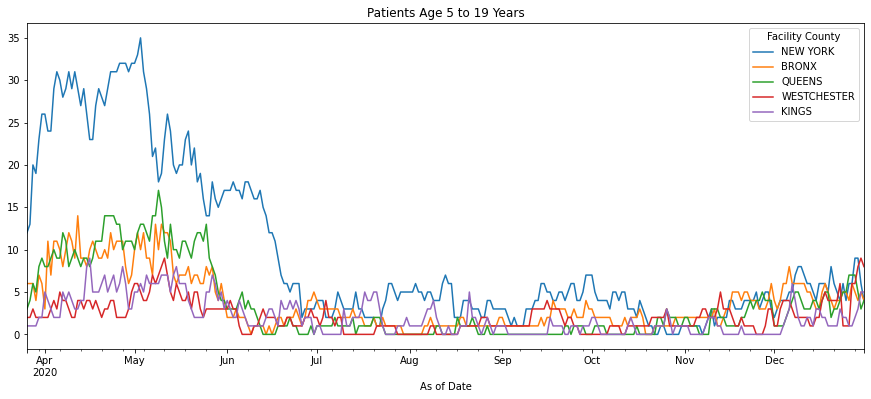

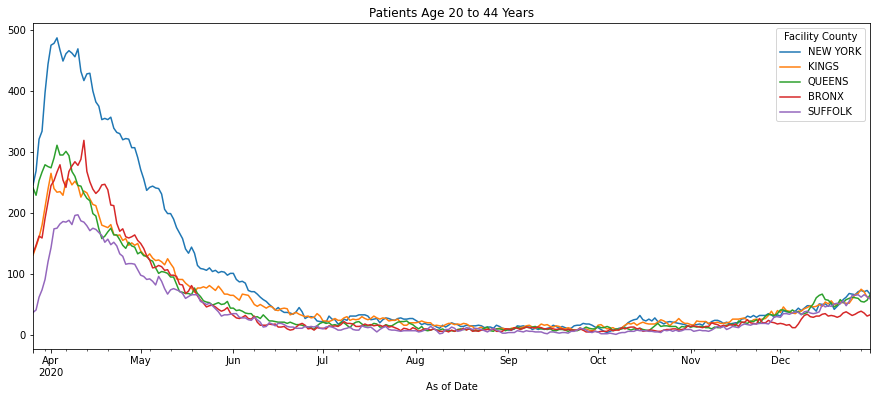

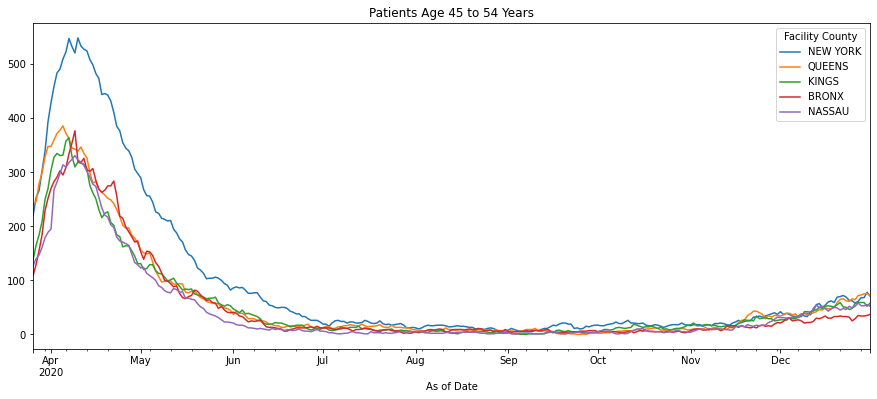

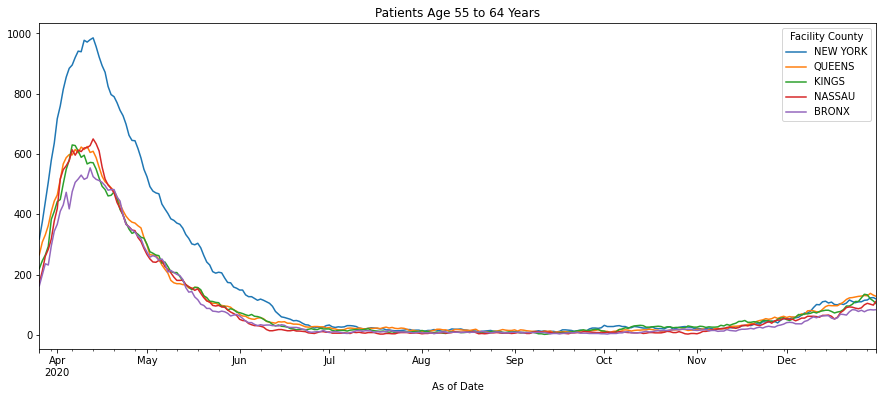

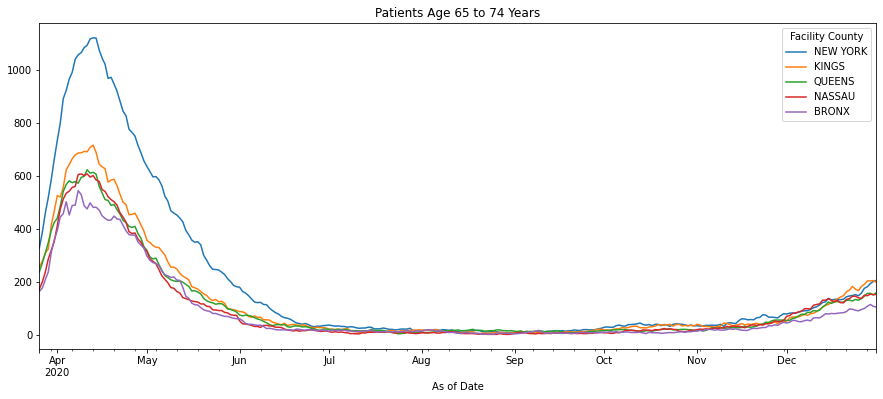

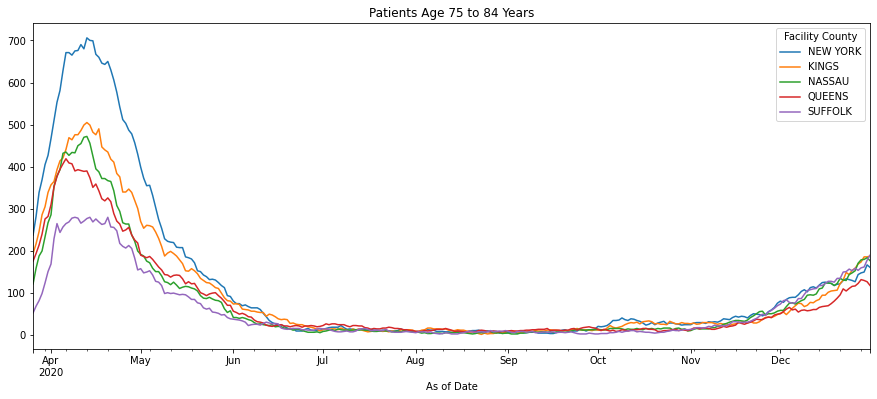

In [44]:
# Top 5 counties with the highest number of ICU patients by day in 2020
age_columns = ['Patients Age 1 To 4 Years', 'Patients Age 5 to 19 Years', 'Patients Age 20 to 44 Years',
               'Patients Age 45 to 54 Years', 'Patients Age 55 to 64 Years', 'Patients Age 65 to 74 Years',
               'Patients Age 75 to 84 Years']
data_2020 = all_data[all_data['As of Date'] < '01-01-2021']
data_2020_by_county_sum = data_2020.groupby('Facility County Modified').sum()
for age in age_columns:
    data_2020_by_county = data_2020_by_county_sum[age]
    top5 = data_2020_by_county.sort_values(ascending=False)[:5].index.to_list()
    bottom5 = data_2020_by_county.sort_values(ascending=True)[:5].index.to_list()
    data_2020_by_county = data_2020.groupby(['As of Date', 'Facility County Modified']).sum()[age].unstack()

    fig, ax = plt.subplots(figsize=(15,6))
    ax.set_title(age)
    data_2020_by_county[top5].plot(ax=ax)
    plt.show()

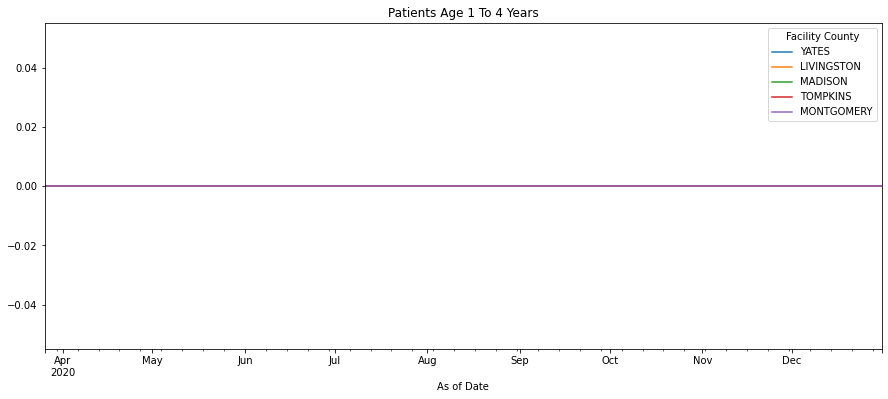

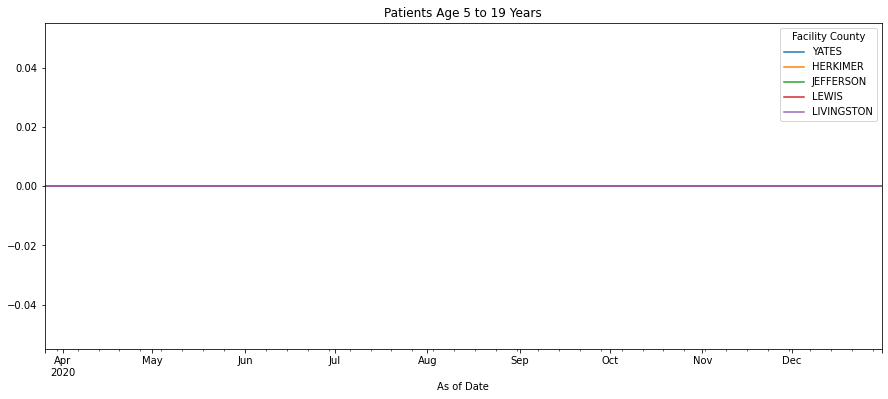

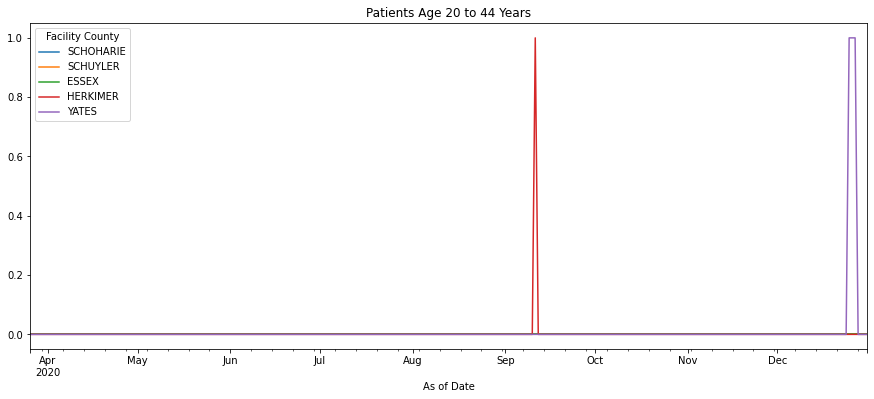

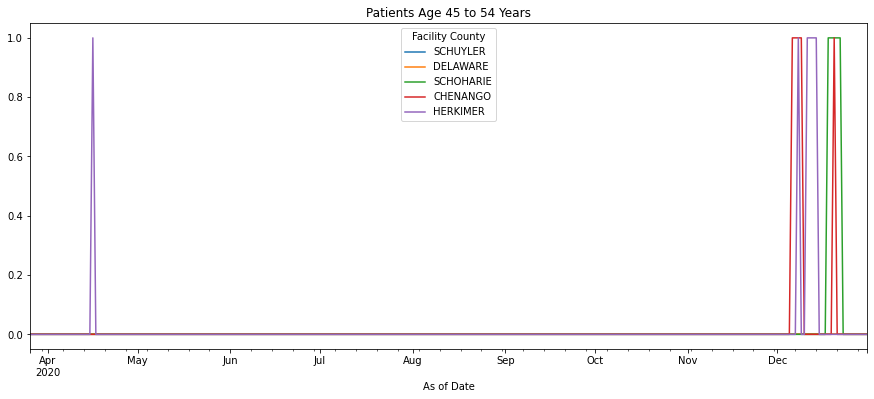

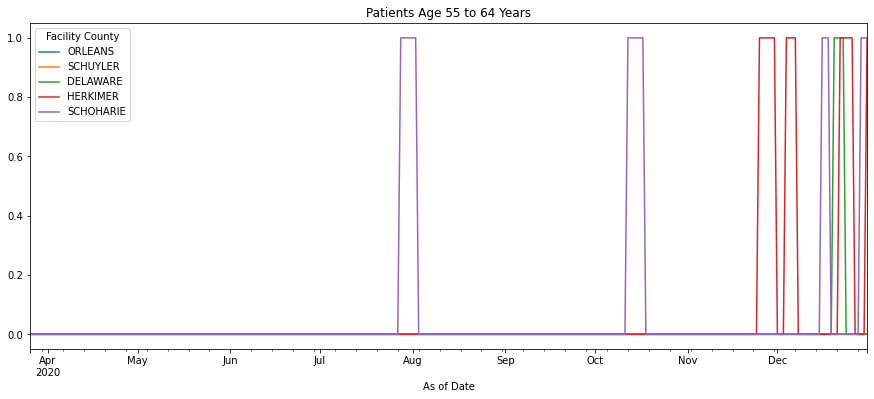

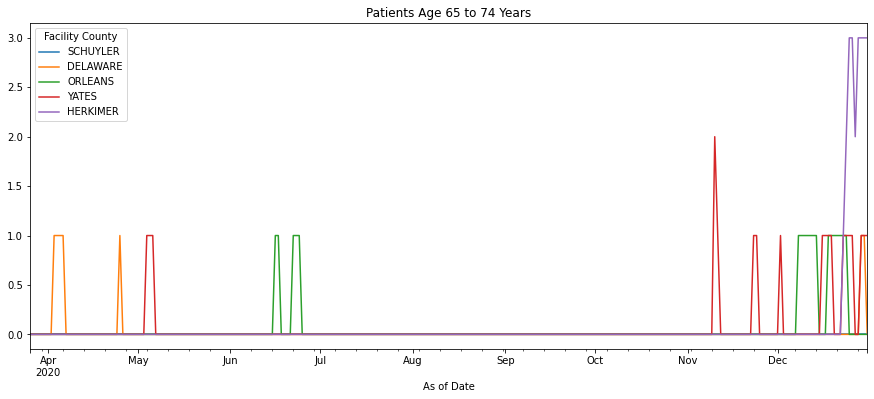

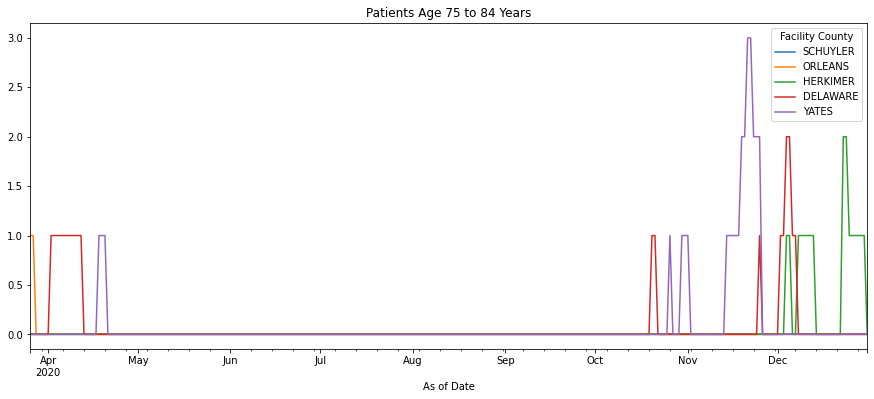

In [45]:
# Top 5 counties with the highest number of ICU patients by day in 2020
age_columns = ['Patients Age 1 To 4 Years', 'Patients Age 5 to 19 Years', 'Patients Age 20 to 44 Years',
               'Patients Age 45 to 54 Years', 'Patients Age 55 to 64 Years', 'Patients Age 65 to 74 Years',
               'Patients Age 75 to 84 Years']
data_2020 = all_data[all_data['As of Date'] < '01-01-2021']
data_2020_by_county_sum = data_2020.groupby('Facility County').sum()
for age in age_columns:
    data_2020_by_county = data_2020_by_county_sum[age]
    top5 = data_2020_by_county.sort_values(ascending=False)[:5].index.to_list()
    bottom5 = data_2020_by_county.sort_values(ascending=True)[:5].index.to_list()
    data_2020_by_county = data_2020.groupby(['As of Date', 'Facility County']).sum()[age].unstack()

    fig, ax = plt.subplots(figsize=(15,6))
    ax.set_title(age)
    data_2020_by_county[bottom5].plot(ax=ax)
    plt.show()

In [80]:
data_2020 = all_data[all_data['As of Date'] < '01-01-2021'].copy()
data_2020.loc[:,'Month'] = data_2020.apply(lambda x: x['As of Date'].month, axis=1)

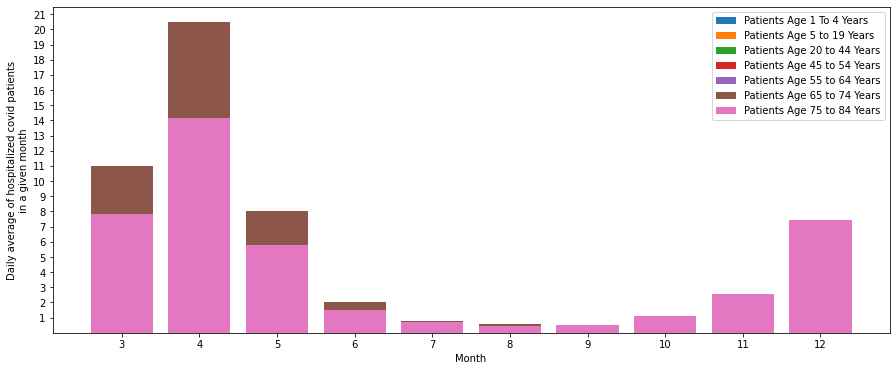

In [103]:
age_columns = ['Patients Age 1 To 4 Years', 'Patients Age 5 to 19 Years', 'Patients Age 20 to 44 Years',
               'Patients Age 45 to 54 Years', 'Patients Age 55 to 64 Years', 'Patients Age 65 to 74 Years',
               'Patients Age 75 to 84 Years']


grouped_data = data_2020.groupby('Month').mean()
fig, ax = plt.subplots(figsize=(15,6))
max_data = 0
for age in age_columns:
    data = grouped_data[age]
    labels = grouped_data[age].index.to_list()
    plt.bar(labels, data, label=age)
    if max(data) > max_data:
        max_data = max(data)
    
ax.set_ylabel('Daily average of hospitalized covid patients\nin a given month')
ax.set_xlabel('Month')
plt.xticks(np.arange(3, 13, 1.0))
plt.yticks(np.arange(1, max_data+1, 1.0))
plt.legend()
plt.show()

In [86]:
data_2021 = all_data[(all_data['As of Date'] >= '01-01-2021') & (all_data['As of Date'] < '01-01-2022')].copy()
data_2021.loc[:,'Month'] = data_2021.apply(lambda x: x['As of Date'].month, axis=1)

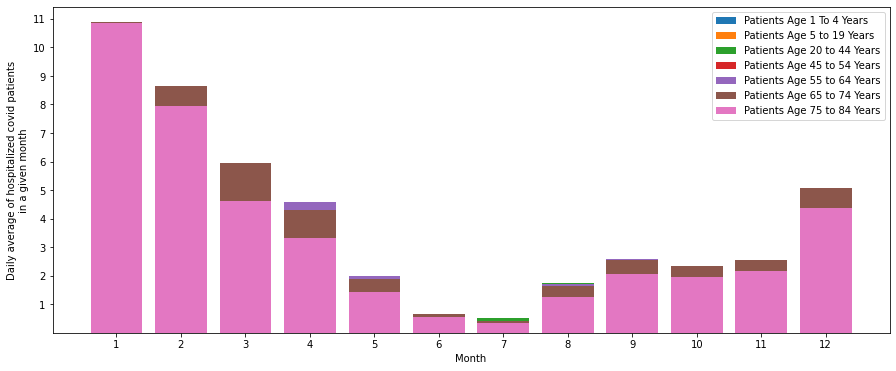

In [104]:
age_columns = ['Patients Age 1 To 4 Years', 'Patients Age 5 to 19 Years', 'Patients Age 20 to 44 Years',
               'Patients Age 45 to 54 Years', 'Patients Age 55 to 64 Years', 'Patients Age 65 to 74 Years',
               'Patients Age 75 to 84 Years']

max_data = 0
grouped_data = data_2021.groupby('Month').mean()
fig, ax = plt.subplots(figsize=(15,6))
for age in age_columns:
    data = grouped_data[age]
    labels = grouped_data[age].index.to_list()
    plt.bar(labels, data, label=age)
    if max(data) > max_data:
        max_data = max(data)

ax.set_ylabel('Daily average of hospitalized covid patients\nin a given month')
ax.set_xlabel('Month')
plt.xticks(np.arange(1, 13, 1.0))
plt.yticks(np.arange(1, max_data+1, 1.0))
plt.legend()
plt.show()

# BED AVAILABILITY

In [49]:
# all_data['Total Staffed Beds']
# all_data['Total Staffed Beds Currently Available']
# all_data['Total Staffed ICU Beds']
# all_data['Total Staffed ICU Beds Currently Available']

In [56]:
all_data['Total Staffed Beds Availability'] = all_data['Total Staffed Beds Currently Available'] / all_data['Total Staffed Beds']
all_data['Total Staffed ICU Beds Availability'] = all_data['Total Staffed ICU Beds Currently Available'] / all_data['Total Staffed ICU Beds']

In [57]:
all_data.head()

,As of Date,Facility PFI,Facility Name,DOH Region,Facility County,Facility Network,NY Forward Region,Patients Currently Hospitalized,Patients Newly Admitted,Patients Positive After Admission,...,Patients Age 65 to 74 Years,Patients Age 75 to 84 Years,Patients Age Greater Than 85 Years,Hospitalized Indicator,Facility County Modified,POP2020,Patients Currently Hospitalized_by_pop,Patients Currently in ICU_by_pop,Total Staffed Beds Availability,Total Staffed ICU Beds Availability
0,2020-03-26,1,ALBANY MEDICAL CENTER HOSPITAL,CAPITAL DISTRICT REGIONAL OFFICE,ALBANY,ALBANY MEDICAL CENTER,CAPITAL REGION,12.0,1.0,1.0,...,3.0,2.0,1.0,0,ALBANY,314848.0,0.000038,0.000019,0.315508,0.600000
1,2020-03-26,5,ST PETERS HOSPITAL,CAPITAL DISTRICT REGIONAL OFFICE,ALBANY,ST. PETERS HEALTH PARTNERS,CAPITAL REGION,10.0,0.0,2.0,...,4.0,2.0,1.0,0,ALBANY,314848.0,0.000032,0.000010,0.324385,0.350000
2,2020-03-26,37,CUBA MEMORIAL HOSPITAL INC,WESTERN REGIONAL OFFICE,ALLEGANY,INDEPENDENT,WESTERN NEW YORK,0.0,0.0,0.0,...,0.0,0.0,0.0,0,ALLEGANY,46449.0,0.000000,0.000000,0.800000,NaN
3,2020-03-26,39,MEMORIAL HOSP OF WM F AND GERTRUDE F JONES AKA...,WESTERN REGIONAL OFFICE,ALLEGANY,UNIVERSITY OF ROCHESTER MEDICAL CENTER,WESTERN NEW YORK,0.0,0.0,0.0,...,0.0,0.0,0.0,0,ALLEGANY,46449.0,0.000000,0.000000,0.591837,0.333333
4,2020-03-26,42,UNITED HEALTH SERVICES HOSPITALS INC - BINGHAM...,CENTRAL REGIONAL OFFICE,BROOME,"UNITED HEALTH SERVICES HOSPITALS, INC.",SOUTHERN TIER,0.0,0.0,0.0,...,0.0,0.0,0.0,0,BROOME,198683.0,0.000000,0.000000,0.412587,0.750000


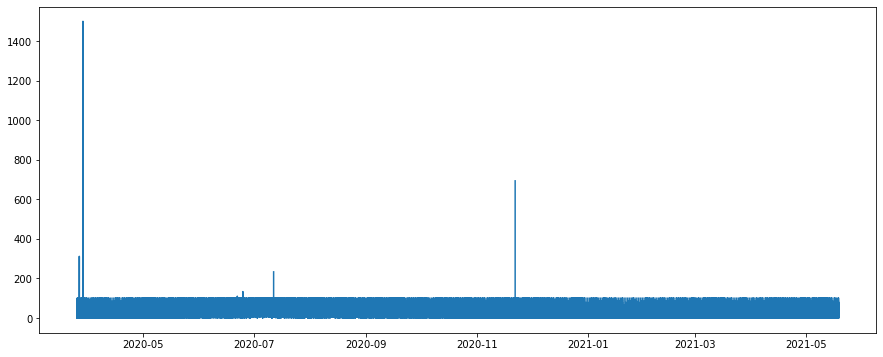

In [58]:
fig, ax = plt.subplots(figsize=(15,6))
ax.plot(all_data['As of Date'], all_data['Total Staffed ICU Beds Availability'] * 100)
ax.xlabel = 'Days of the Year'
ax.ylabel = 'Number of COVID patients Hospitalized'
plt.show()

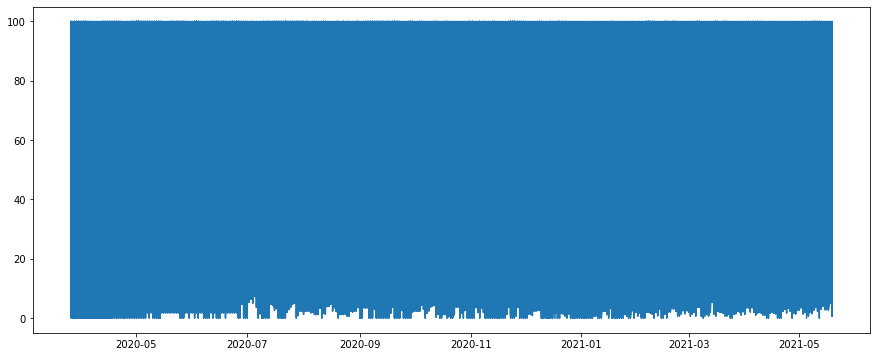

In [59]:
fig, ax = plt.subplots(figsize=(15,6))
ax.plot(all_data['As of Date'], all_data['Total Staffed Beds Availability'] * 100)
ax.xlabel = 'Days of the Year'
ax.ylabel = 'Number of COVID patients Hospitalized'
plt.show()

# TODO:

In [2]:
## Normalization by population of each county (Get file from Gonick )
## Wrap code into a visualization function for similar plots to avoid repetitive code.
## Calculate Bed Load
## Gather Insights for further analysis
## Group New York Regions as one --> 'NEW YORK, BRONX, KINGS, RICHMOND, QUEENS'
## Correst ST LAWRANCE WITH ST.LAWRANCE
## Use unstack for firt plots